# Тестовое задание по направлению "Аналитик данных"

##  <span style="color:red">Данные</span>

Представлены данные о 4 компаниях: <span style="color:red">Red</span>, Black, <span style="color:green">Green</span> и <span style="color:blue">Blue</span>

Описание колонок:
- <span style="color:green"> Hid - human_id</span>, зашифрованный персональный идентификатор пользователя компаний
- <span style="color:green">has_company_id</span> - наличие зарегистрированного аккаунта в компании
- <span style="color:green">company_gmv_total</span> - суммарный gmv пользователя в сервисе
- <span style="color:green">company_gmv_order_count</span> - количество успешных заказов пользователя в сервисе
- <span style="color:green">company_activity_count</span> - количество активных действий пользователя в сервисе
- <span style="color:green">company_android</span> - установленное у пользователя приложение в компании на платформе android
- <span style="color:green">company_apple</span> - установленное у пользователя приложение компании на платфоме Apple
- <span style="color:green">company_web</span> - установленное у пользователя приложение компании на ПК
- <span style="color:green">is_msk</span> - территориальное расположение в Москве

## <span style="color:red"> Задание </span>
#### <span style="color:blue"> Какие выводы вы можете сделать на основании этих данных? </span>

Импортируем необходимые библиотеки

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### **<span style="color:green"> Данные</span>**

Предварительно посмотрев данные в excel, можно заметить, что у нас присутствует пустая строка сверху, которую можно предварительно удалить для корректного отображения данных. 

In [2]:
df = pd.read_excel('Analytic_test.xlsx', header = 1, index_col = 0)
df.head()

,HID,active_Red,has_Green_id,has_Black_id,has_Blue_id,Blue_activity_count,Blue_gmv_total,Green_gvm_total,Green_gvm_order_count,Black_gvm_total,...,Blue_android,Red_apple,Green_apple,Black_apple,Blue_apple,is_msk,Red_web,Green_web,Black_web,Blue_web
0,00003c7fb5e57ce673f1801f3679f5c25,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,00006b602533083e3bebfcbff08613931,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0000736c3f76339196cb1cc759b8363b,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,00009bdcc5307b38efde8690b8bd658e,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0000bc3186b7b31d9b35d3fbbb250b9f8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### **<span style="color:green"> Предобработка</span>**

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   HID                    100000 non-null  object 
 1   active_Red             100000 non-null  float64
 2   has_Green_id           100000 non-null  float64
 3   has_Black_id           100000 non-null  float64
 4   has_Blue_id            100000 non-null  float64
 5   Blue_activity_count    100000 non-null  object 
 6   Blue_gmv_total         99999 non-null   float64
 7   Green_gvm_total        100000 non-null  float64
 8   Green_gvm_order_count  100000 non-null  object 
 9   Black_gvm_total        100000 non-null  float64
 10  Black_gvm_order_count  100000 non-null  object 
 11  Red_android            100000 non-null  float64
 12  Green_android          100000 non-null  float64
 13  Black_android          100000 non-null  float64
 14  Blue_android           100000 non-nul

Видим, что во всех колонках, за исключением Blue_gmv_total, отсутсвуют нулевые значения. Так как оно одно, удалим его.

In [4]:
df = df.dropna()

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99999 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   HID                    99999 non-null  object 
 1   active_Red             99999 non-null  float64
 2   has_Green_id           99999 non-null  float64
 3   has_Black_id           99999 non-null  float64
 4   has_Blue_id            99999 non-null  float64
 5   Blue_activity_count    99999 non-null  object 
 6   Blue_gmv_total         99999 non-null  float64
 7   Green_gvm_total        99999 non-null  float64
 8   Green_gvm_order_count  99999 non-null  object 
 9   Black_gvm_total        99999 non-null  float64
 10  Black_gvm_order_count  99999 non-null  object 
 11  Red_android            99999 non-null  float64
 12  Green_android          99999 non-null  float64
 13  Black_android          99999 non-null  float64
 14  Blue_android           99999 non-null  float64
 15  Re

Видим, что теперь нулевых значений нет

 ### 1. Изучим "наличие зарегистрированного аккаунта в компании" (<span style="color:green">has_company_id</span>) для каждой компании
 
 Согласно таблице *df*, мы имеем данный признак только для компаний *Green, Black* и *Blue*. Для компании *Red* мы имеем колонку *active_Red*, описания которой нет в представленной документации. 
 
 Чтобы отнести ее к одному из перечисленных в документации признаков, исследуем тип данных в колнках <span style="color:green">has_company_id</span> и <span style="color:green">company_activity_count</span>

In [6]:
#Выберем уникальные значения соответствуюших колонок
black = df['has_Black_id'].value_counts()
blue = df['has_Blue_id'].value_counts()
green = df['has_Green_id'].value_counts()

#Объединим их в одну таблицу для наглядности
table = pd.concat([black, blue, green], axis=1).fillna(0).astype(int)
table

,has_Black_id,has_Blue_id,has_Green_id
0.0,98920,86734,99114
1.0,1074,12749,881
2.0,5,501,4
3.0,0,13,0
4.0,0,2,0


Видим, что в колонках <span style="color:green">has_company_id</span> представлены категориальные данные, где предположительно *0* соответсвует **"нет"**, *1* соответствует **"да"**, а *2 - 4* являются некорректно заполненными данными. 

In [7]:
diff = df['Blue_activity_count'].unique()
amount = (df['Blue_activity_count'].nunique())

print(f'Всего в колонке Blue_activity_count {amount} разных значений:')
print(diff)

Всего в колонке Blue_activity_count 69 разных значений:
['2.0' '0.0' '1.0' '17.0' '13.0' '5.0' '6.0' '26.0' '8.0' '4.0' '27.0'
 '19.0' '12.0' '9.0' '3.0' '20.0' '10.0' '23.0' '7.0' '16.0' '14.0' '15.0'
 '53.0' datetime.datetime(2019, 5, 4, 0, 0) '32.0' '11.0' '18.0' '24.0'
 '119.0' '49.0' '39.0' '21.0' datetime.datetime(2019, 5, 7, 0, 0) '35.0'
 '72.0' '30.0' '71.0' '28.0' '42.0' '34.0' '41.0' '22.0' '29.0' '36.0'
 '90.0' '40.0' '43.0' datetime.datetime(2019, 5, 1, 0, 0) '51.0' '44.0'
 '25.0' '31.0' '45.0' '67.0' '33.0' '101.0' '74.0' '46.0' '111.0' '66.0'
 '38.0' '63.0' '100.0' '237.0' '59.0' datetime.datetime(2019, 5, 3, 0, 0)
 datetime.datetime(2019, 5, 6, 0, 0) '37.0' '47.0']


В представленных данных *сведения о количество активных действий пользователя в сервисе* (<span style="color:green">company_activity_count</span>) представлены только для компании Blue.

Данные представлены в виде целочисленных значений и datetime.

In [8]:
df['active_Red'].value_counts()

1.0    55874
0.0    44125
Name: active_Red, dtype: int64

Колонка *active_Red* имеет только значения 1 и 0, в связи с чем, вероятно, является неверно названной колонкой *has_Red_id*. Переименуем её.

In [9]:
df.rename(columns = {'active_Red':'has_Red_id'}, inplace = True )

#Также исправим опечатку в названиях колонок фирм Green и Black, исправив 'gvm' на 'gmv'
df.rename(columns = {'Green_gvm_total':'Green_gmv_total', 
                    'Green_gvm_order_count':'Green_gmv_order_count',
                    'Black_gvm_total':'Black_gmv_total',
                    'Black_gvm_order_count':'Black_gmv_order_count'}, inplace = True )

Так как некорректно введеные данные в колонках <span style="color:green">has_company_id</span>, соответсвующие значениям 2, 3 и 4, составляют 0.5% от всех данных, можем их удалить.

In [10]:
#Находим индексы, которым соответствуют некорректным значениям 2, 3 и 4 
df1 = df.loc[(df['has_Black_id'] == 2) | 
             (df['has_Blue_id'] == 2) |
            (df['has_Blue_id'] == 3) |
             (df['has_Blue_id'] == 4) |
            (df['has_Green_id'] == 2) ]

#Выставим возможность скопировать все индексы
pd.set_option('display.max_rows', 100000)
df1.index.tolist()

[452,
 470,
 608,
 618,
 798,
 1036,
 1142,
 1341,
 1426,
 1469,
 1633,
 1933,
 2065,
 2242,
 2554,
 2721,
 2830,
 2870,
 3185,
 3213,
 3453,
 3662,
 3904,
 4563,
 4616,
 5147,
 5212,
 5272,
 5745,
 6117,
 6182,
 6718,
 6992,
 7346,
 7464,
 7475,
 7671,
 7721,
 7743,
 7913,
 8141,
 8296,
 8351,
 8414,
 9117,
 9122,
 9361,
 9481,
 9488,
 9698,
 9933,
 10051,
 10125,
 10349,
 10551,
 10590,
 10835,
 10854,
 11955,
 12290,
 12478,
 12543,
 12544,
 12569,
 12707,
 12746,
 13098,
 13112,
 13388,
 13774,
 13806,
 13951,
 14790,
 15107,
 15324,
 15328,
 15876,
 15993,
 16243,
 16311,
 16778,
 16800,
 17254,
 17641,
 17801,
 18013,
 18072,
 18167,
 18253,
 18257,
 18391,
 18452,
 18538,
 18807,
 18831,
 18900,
 19134,
 19405,
 19609,
 19718,
 20127,
 20169,
 20760,
 21256,
 21362,
 21623,
 21654,
 21765,
 21985,
 22056,
 22136,
 22396,
 22461,
 22569,
 22623,
 23056,
 23224,
 23994,
 24057,
 24238,
 24370,
 24678,
 24841,
 24906,
 25018,
 25575,
 26045,
 26756,
 26769,
 27359,
 28345,
 28433,


In [11]:
df = df.drop(labels = [452, 470, 608, 618, 798, 1036, 1142, 1341, 1426, 1469, 1633, 1933, 2065, 2242, 2554, 2721, 2830, 2870, 3185, 3213, 3453, 3662, 3904, 4563, 4616, 5147, 5212, 5272, 5745, 6117, 6182, 6718, 6992, 7346, 7464, 7475, 7671, 7721, 7743, 7913, 8141, 8296, 8351, 8414, 9117, 9122, 9361, 9481, 9488, 9698, 9933, 10051, 10125, 10349, 10551, 10590, 10835, 10854, 11955, 12290, 12478, 12543, 12544, 12569, 12707, 12746, 13098, 13112, 13388, 13774, 13806, 13951, 14790, 15107, 15324, 15328, 15876, 15993, 16243, 16311, 16778, 16800, 17254, 17641, 17801, 18013, 18072, 18167, 18253, 18257, 18391, 18452, 18538, 18807, 18831, 18900, 19134, 19405, 19609, 19718, 20127, 20169, 20760, 21256, 21362, 21623, 21654, 21765, 21985, 22056, 22136, 22396, 22461, 22569, 22623, 23056, 23224, 23994, 24057, 24238, 24370, 24678, 24841, 24906, 25018, 25575, 26045, 26756, 26769, 27359, 28345, 28433, 28663, 28944, 29004, 29014, 29088, 29114, 29363, 30040, 30052, 30084, 30144, 30153, 30353, 30689, 30715, 31478, 31800, 32112, 32217, 32412, 32424, 32425, 32539, 32573, 32641, 32876, 32918, 33207, 33535, 33681, 33759, 33805, 33883, 34148, 34192, 34355, 34531, 34573, 34907, 35104, 35218, 35773, 35925, 36015, 36297, 36668, 37082, 37123, 37347, 37515, 37614, 37866, 37988, 38177, 38245, 38366, 38403, 38513, 38899, 39008, 39163, 39418, 39535, 39657, 39683, 40087, 40142, 40662, 40713, 41061, 41162, 41571, 41664, 41676, 41698, 41754, 42059, 42211, 42532, 42666, 42804, 42810, 42970, 42977, 43069, 43279, 43298, 43536, 43606, 43740, 43831, 44046, 44102, 44311, 44479, 44523, 44862, 45250, 45254, 46246, 46274, 46559, 46617, 46655, 46698, 46736, 46840, 46943, 47225, 47443, 47604, 47629, 47906, 48360, 48740, 48870, 49165, 49578, 49591, 49742, 49795, 50035, 50830, 50916, 50977, 51514, 51576, 51579, 51728, 51815, 52213, 52229, 52317, 53088, 53173, 53375, 53525, 53816, 53924, 54268, 54856, 54890, 55450, 55762, 55849, 55871, 55874, 56040, 56222, 56247, 56491, 56589, 56879, 57115, 57225, 57326, 57943, 57954, 58009, 58032, 58204, 58284, 58397, 58637, 58748, 58926, 58959, 58998, 59095, 59416, 59555, 59573, 59871, 59892, 60264, 60327, 60904, 60976, 61292, 61325, 61487, 61708, 61847, 62298, 62379, 62399, 62623, 62640, 62820, 63023, 63216, 63262, 63475, 63522, 63581, 63712, 63769, 63898, 63942, 64000, 64137, 64246, 64579, 64660, 64842, 64884, 64940, 64956, 65262, 65372, 65450, 65642, 65657, 65994, 66001, 66279, 66386, 66510, 66763, 67204, 67684, 67721, 67733, 67781, 67810, 67853, 68297, 68403, 68418, 68860, 68866, 68895, 69015, 69050, 69051, 70687, 70854, 70914, 71539, 71577, 71726, 72033, 72034, 72236, 72355, 72362, 72715, 72767, 72802, 73330, 73442, 73470, 73483, 73751, 75238, 75284, 75368, 75386, 75475, 75641, 75817, 75853, 75890, 76031, 76507, 77049, 77114, 77464, 77883, 77905, 78317, 78658, 78739, 78766, 78899, 78930, 79011, 79097, 79099, 79570, 79666, 79882, 80272, 80281, 80357, 80435, 80500, 80561, 80941, 80946, 80966, 81136, 81292, 81412, 81460, 81543, 81631, 81661, 82232, 82234, 82261, 82331, 82566, 82638, 83097, 83352, 83640, 83724, 83794, 83989, 84006, 84009, 84115, 84243, 84634, 84724, 84822, 84829, 85205, 85217, 85724, 85766, 85914, 86142, 86173, 86365, 86531, 86828, 86879, 86882, 87072, 87387, 87437, 87653, 88214, 88247, 88609, 88712, 88756, 89496, 89714, 89877, 89997, 90092, 90130, 90161, 90660, 90989, 91212, 91390, 91397, 91807, 91934, 91936, 92124, 92240, 92290, 92309, 92379, 92396, 92449, 92540, 92700, 93186, 93360, 93379, 94126, 94558, 94664, 94747, 94912, 94921, 95036, 95337, 95485, 95706, 95987, 96255, 96779, 96821, 97576, 97668, 97928, 98492, 98498, 98974, 99069, 99338, 99587, 99781, 99851, 99899],axis = 0)

Проверим, что наши данные теперь представлены в бинарном виде для всех компаний

In [12]:
black = df['has_Black_id'].value_counts()
blue = df['has_Blue_id'].value_counts()
green = df['has_Green_id'].value_counts()
red = df['has_Red_id'].value_counts()

table = pd.concat([black, blue, green, red], axis=1).fillna(0).astype(int)
table

,has_Black_id,has_Blue_id,has_Green_id,has_Red_id
0.0,98410,86729,98601,44016
1.0,1065,12746,874,55459


In [13]:
#проверяем, что у нас удалилось 525 строк
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99475 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   HID                    99475 non-null  object 
 1   has_Red_id             99475 non-null  float64
 2   has_Green_id           99475 non-null  float64
 3   has_Black_id           99475 non-null  float64
 4   has_Blue_id            99475 non-null  float64
 5   Blue_activity_count    99475 non-null  object 
 6   Blue_gmv_total         99475 non-null  float64
 7   Green_gmv_total        99475 non-null  float64
 8   Green_gmv_order_count  99475 non-null  object 
 9   Black_gmv_total        99475 non-null  float64
 10  Black_gmv_order_count  99475 non-null  object 
 11  Red_android            99475 non-null  float64
 12  Green_android          99475 non-null  float64
 13  Black_android          99475 non-null  float64
 14  Blue_android           99475 non-null  float64
 15  Re

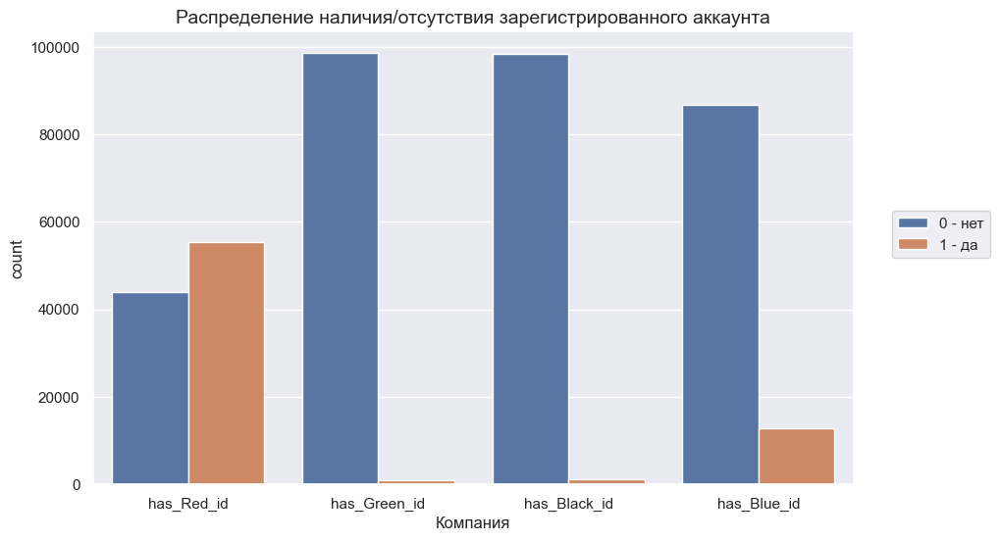

In [14]:
#Представим графически распределение бинарного распределения зарегистрированных аккаунтов
plt.figure(figsize = (10, 6))
sns.set(style="darkgrid")
sns.countplot(data = df[['has_Red_id', 'has_Green_id', 'has_Black_id', 'has_Blue_id']].melt(var_name='variable', value_name='value'), 
              x='variable', hue='value')
plt.xlabel('Компания')
plt.title('Распределение наличия/отсутствия зарегистрированного аккаунта', size = 14)
plt.legend(['0 - нет', '1 - да'], loc = (1.05, 0.5));

Данный график показывает, что во всех компаниях, за исключением Red, у нас представлено неравномерное распределение наличия/отсутствия аккаунтов

Проверим, присутсвуют ли в данных пользователи, имеющие регистрацию в нескольких компаниях

In [15]:
#создаем новый датафрейм,включающий в себя только has_id
df_id = df[['HID','has_Red_id', 'has_Green_id', 'has_Black_id', 'has_Blue_id']]

#проверяем, есть ли пользователи с регистрациями в нескольких компаниях
a = 0
zero = 0
one = 0
two = 0
three = 0
four = 0
for index, row in df_id.iterrows():
    if sum(row[1:]) == 1:
        print(f"Пользователь {row['HID']} имеет регистрацию в одной компании")
        one += 1 
    elif sum(row[1:]) == 2:
        print(f"Пользователь {row['HID']} имеет регистрацию в двух компаниях")
        a += 1
        two += 1
    elif sum(row[1:]) == 3:
        print(f"Пользователь {row['HID']} имеет регистрацию в трех компаниях")
        a += 1
        three += 1
    elif sum(row[1:]) == 4:
        print(f"Пользователь {row['HID']} имеет регистрацию в четырех компаниях")
        a += 1
        four += 1
    elif sum(row[1:]) == 0:
        print(f"Пользователь {row['HID']} не имеет регистрации ни в одной компании")
        zero += 1

Пользователь 00003c7fb5e57ce673f1801f3679f5c25 имеет регистрацию в одной компании
Пользователь 00006b602533083e3bebfcbff08613931 имеет регистрацию в одной компании
Пользователь 0000736c3f76339196cb1cc759b8363b имеет регистрацию в одной компании
Пользователь 00009bdcc5307b38efde8690b8bd658e не имеет регистрации ни в одной компании
Пользователь 0000bc3186b7b31d9b35d3fbbb250b9f8 имеет регистрацию в одной компании
Пользователь 0000c3f7c3075b31690f03025176c601b имеет регистрацию в одной компании
Пользователь 0000c938bb375d76f9725e9c6b3f11bdf имеет регистрацию в одной компании
Пользователь 0000ce9e53f36b181b7c693f50b333c1 имеет регистрацию в одной компании
Пользователь 0000e5b1353ee99107c35e3e61e9331f имеет регистрацию в одной компании
Пользователь 0000fecdb5b3b2536636f318880bbb715 не имеет регистрации ни в одной компании
Пользователь 000101f7135958bbebb125ff9335b69c6 имеет регистрацию в одной компании
Пользователь 00010703fb8919025b93025eb98cbc75e5 имеет регистрацию в одной компании
Пользов

In [16]:
print(f'{one} пользователей имеет регистрацию в одной компании,',
      f'{a} пользователей имеет регистрации в нескольких компаниях ',
     f'из них:',
     f'{two} имеет две регистрации',
     f'{three} имеет три регистрации',
     f'{four} имеет четыре регистрации',
     f'{one} имеет одну регистрацию',
     f'А {zero} не имеет ни одной регистрации, что может быть связано'
      f' с тем, что они ранее были пользователями одной из компаний, '
      f'а теперь ушли от неё.', sep = '\n') 

52491 пользователей имеет регистрацию в одной компании,
8630 пользователей имеет регистрации в нескольких компаниях 
из них:
8255 имеет две регистрации
357 имеет три регистрации
18 имеет четыре регистрации
52491 имеет одну регистрацию
А 38354 не имеет ни одной регистрации, что может быть связано с тем, что они ранее были пользователями одной из компаний, а теперь ушли от неё.


Представим графически данное распределение зарегистрированных аккаунтов

''

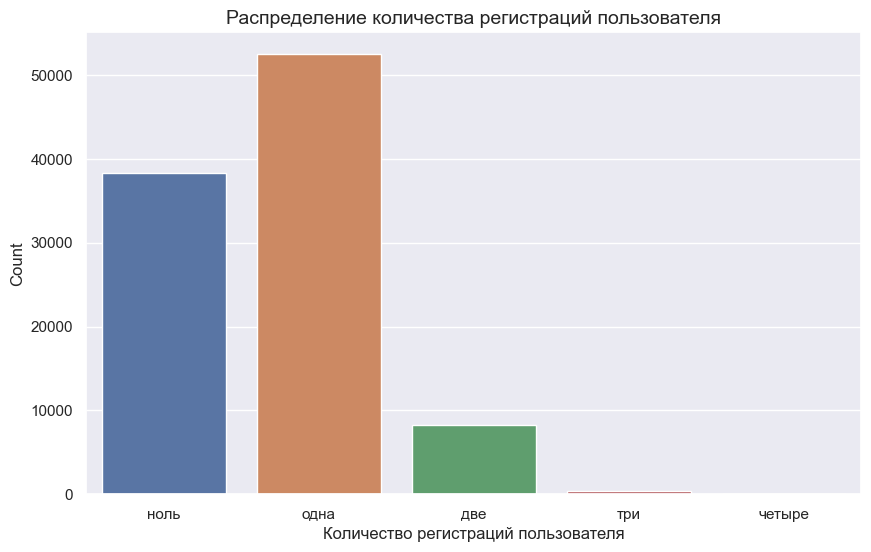

In [17]:
#Создаем данные для построения countplot
name = ['ноль', 'одна', 'две', 'три', 'четыре']
amount = [38354, 52491, 8255, 357, 18]

#Строим график
plt.figure(figsize = (10, 6))
sns.barplot(x = name, y = amount)
plt.xlabel('Количество регистраций пользователя')
plt.ylabel('Count')
plt.title('Распределение количества регистраций пользователя', size = 14)
;

Несмотря на то, что пользователи, не имеющие ни одной регистрации составляют 38% от всех данных, они не представляют ценности для дальнейшего анализа данных, а также могут стать мешающим фактором для дальнейших исследований.

Чтобы проверить наше предположение, создадим новую колонку "Registration", в которой *1* - есть хотя бы одна регистрация в компании, и *0* - нет ни одной регистрации, и сравним распредение ее метрик по всем компаниям.

In [18]:
#создадим список, где 1 - есть хотя бы одна регистрация в компании, 
# и 0 - нет ни одной регистрации
registration = df_id.apply(lambda row: 0 if sum(row[1:]) == 0 else 1, axis=1)
#проверим, что длина списка совпадает с длиной датафрейма
print(len(registration))

99475


In [19]:
#Создадим новую колонку в df
df['Registration'] = registration

In [20]:
df.head()

,HID,has_Red_id,has_Green_id,has_Black_id,has_Blue_id,Blue_activity_count,Blue_gmv_total,Green_gmv_total,Green_gmv_order_count,Black_gmv_total,...,Red_apple,Green_apple,Black_apple,Blue_apple,is_msk,Red_web,Green_web,Black_web,Blue_web,Registration
0,00003c7fb5e57ce673f1801f3679f5c25,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,00006b602533083e3bebfcbff08613931,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1
2,0000736c3f76339196cb1cc759b8363b,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,00009bdcc5307b38efde8690b8bd658e,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
4,0000bc3186b7b31d9b35d3fbbb250b9f8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


In [21]:
df[df['Registration'] == 0][['Blue_activity_count', 'Blue_gmv_total',
                            'Green_gmv_total', 'Green_gmv_order_count',
                            'Black_gmv_total', 'Black_gmv_order_count',
                            'Red_android', 'Green_android', 'Black_android', 'Blue_android',
                             'Red_apple', 'Green_apple', 'Black_apple', 'Blue_apple',
                             'Red_web', 'Green_web', 'Black_web', 'Blue_web'
                            ]].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Blue_gmv_total,38354.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Green_gmv_total,38354.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Black_gmv_total,38354.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Red_android,38354.0,0.155655,0.362533,0.0,0.0,0.0,0.0,1.0
Green_android,38354.0,0.003363,0.057898,0.0,0.0,0.0,0.0,1.0
Black_android,38354.0,0.002738,0.052252,0.0,0.0,0.0,0.0,1.0
Blue_android,38354.0,0.049121,0.216124,0.0,0.0,0.0,0.0,1.0
Red_apple,38354.0,0.035433,0.184874,0.0,0.0,0.0,0.0,1.0
Green_apple,38354.0,0.001929,0.043883,0.0,0.0,0.0,0.0,1.0
Black_apple,38354.0,0.003024,0.054913,0.0,0.0,0.0,0.0,1.0


Согласно данной сводной таблице, пользователи, не имеющие регистрации ни в одной компании, не совершали никаких активных действий или покупок в компаниях Green, Blue, Black (для Red инф. отсутствует).
Однако они имели установленные приложения на apple/android/web.

Таким образом мы подтвердили наше предположение, что пользователи, не имеющие ни одной регистрации, не представляют ценности для дальнейшего анализа данных, в связи с чем их можно удалить.

In [22]:
#Оставляем все строки, для которых Registration не равно 0
df = df[df['Registration'] != 0]

#Проверяем, что у нас не осталось пользователей без регистрации
df['Registration'].value_counts()

1    61121
Name: Registration, dtype: int64

In [23]:
#Проверяем, что у нас удалилось 38354.0 значений
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61121 entries, 0 to 99997
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   HID                    61121 non-null  object 
 1   has_Red_id             61121 non-null  float64
 2   has_Green_id           61121 non-null  float64
 3   has_Black_id           61121 non-null  float64
 4   has_Blue_id            61121 non-null  float64
 5   Blue_activity_count    61121 non-null  object 
 6   Blue_gmv_total         61121 non-null  float64
 7   Green_gmv_total        61121 non-null  float64
 8   Green_gmv_order_count  61121 non-null  object 
 9   Black_gmv_total        61121 non-null  float64
 10  Black_gmv_order_count  61121 non-null  object 
 11  Red_android            61121 non-null  float64
 12  Green_android          61121 non-null  float64
 13  Black_android          61121 non-null  float64
 14  Blue_android           61121 non-null  float64
 15  Re

In [24]:
#Удалим колонку 'Registration' за ненадобностью
df.drop(columns = ['Registration'], axis = 1, inplace = True)

### 2. Изучим "количество активных действий пользователя в сервисе" (<span style="color:green">company_activity_count</span>) для каждой компании

Ранее мы увидели, что данный признак представлен только для одной компании *Blue*, и в нем присутствуют целочисленные значения и datetime. Посмотрим на них еще раз.

In [25]:
diff = df['Blue_activity_count'].unique()
amount = (df['Blue_activity_count'].nunique())

print(f'Всего в колонке Blue_activity_count {amount} разных значений:')
print(diff)


Всего в колонке Blue_activity_count 64 разных значений:
['2.0' '0.0' '1.0' '17.0' '13.0' '5.0' '6.0' '26.0' '8.0' '27.0' '19.0'
 '9.0' '4.0' '3.0' '20.0' '10.0' '12.0' '23.0' '7.0' '14.0' '15.0' '16.0'
 '53.0' '32.0' '11.0' '18.0' '24.0' '119.0' '49.0' '39.0' '21.0' '35.0'
 '72.0' '30.0' '71.0' '28.0' '42.0' '34.0' '29.0' '90.0' '43.0' '51.0'
 '44.0' '36.0' '41.0' '22.0' '40.0' '45.0' '31.0' '67.0' '33.0' '25.0'
 '101.0' '74.0' '46.0' '111.0' '66.0' '38.0' '63.0' '100.0' '237.0' '59.0'
 '37.0' '47.0']


Видим, что после обработки данных для *has_company_id* у нас пропали некорректные данные.

Сейчас данные представлены типом *object*. Чтобы визуализировать данный признак, конвертируем их в формат *float64*

In [26]:
df['Blue_activity_count'] = df['Blue_activity_count'].astype('float64')
df.dtypes

HID                       object
has_Red_id               float64
has_Green_id             float64
has_Black_id             float64
has_Blue_id              float64
Blue_activity_count      float64
Blue_gmv_total           float64
Green_gmv_total          float64
Green_gmv_order_count     object
Black_gmv_total          float64
Black_gmv_order_count     object
Red_android              float64
Green_android            float64
Black_android            float64
Blue_android             float64
Red_apple                float64
Green_apple              float64
Black_apple              float64
Blue_apple               float64
is_msk                   float64
Red_web                  float64
Green_web                float64
Black_web                float64
Blue_web                 float64
dtype: object

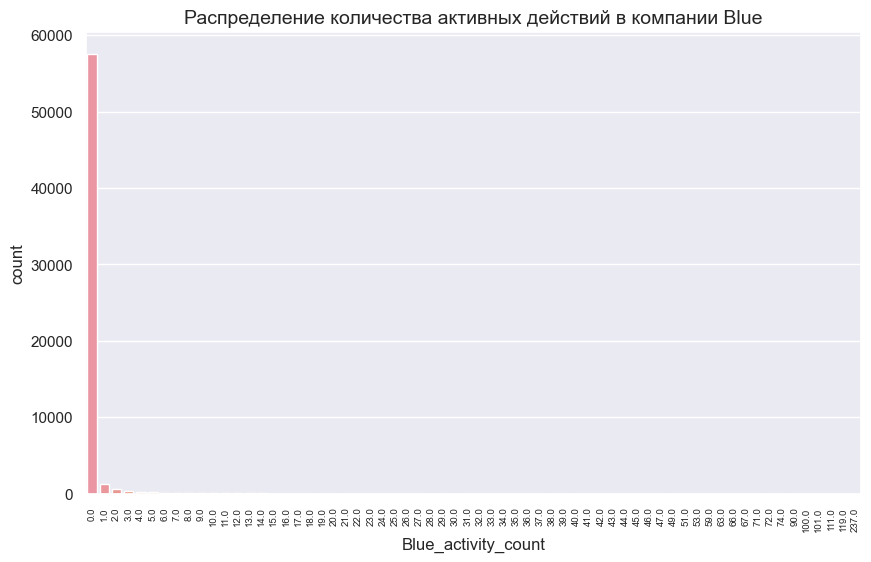

In [27]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Blue_activity_count')
plt.title('Распределение количества активных действий в компании Blue', size = 14)
plt.xticks(rotation = 90, size = 7);

Видим, что большинство пользователей не совершало активных действий в компании Blue. Это может быть объяснено, в том числе и тем, что они были совершены в других компаниях. Добавим условия, и построим распределение еще раз.

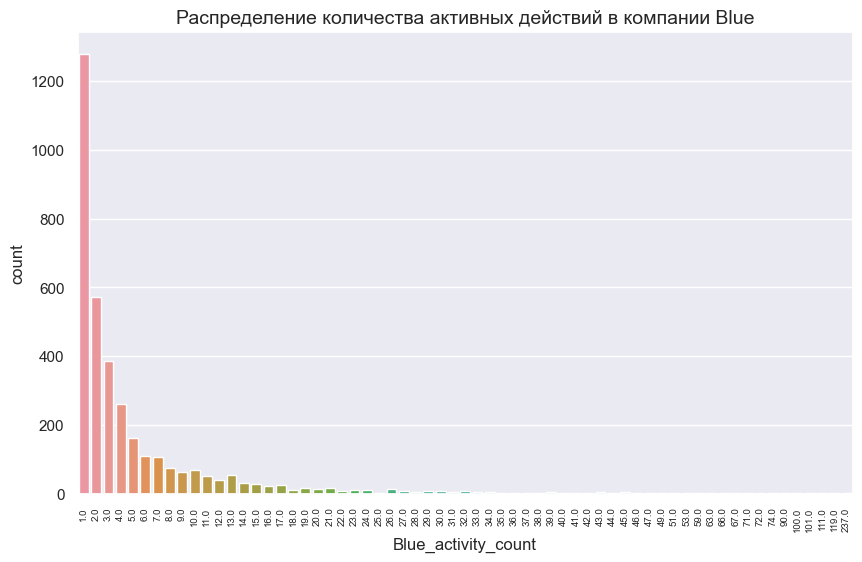

In [28]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df[(df['Blue_activity_count'] != 0) & (df['has_Blue_id'] == 1)], 
              x='Blue_activity_count')
plt.title('Распределение количества активных действий в компании Blue', size = 14)
plt.xticks(rotation = 90, size = 7);

Видим, что большинство пользователей компании Blue совершало 1 - 2 активных действия.

Несмотря на то, что данные представлены только для одной компании, мы покажем, как можно было бы посмотреть взаимосвязь активных действий и суммарный gmv пользователя для всех компаний, в зависимости от приложения, которое он использует. 


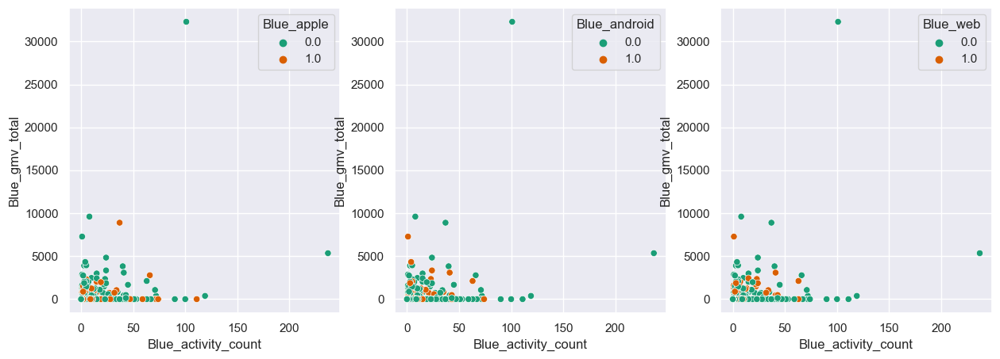

In [29]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
sns.scatterplot(x='Blue_activity_count', y='Blue_gmv_total', data=df, hue='Blue_apple', palette='Dark2', ax=ax[0])
sns.scatterplot(x='Blue_activity_count', y='Blue_gmv_total', data=df, hue='Blue_android', palette='Dark2', ax=ax[1])
sns.scatterplot(x='Blue_activity_count', y='Blue_gmv_total', data=df, hue='Blue_web', palette='Dark2', ax=ax[2])
plt.show()

Видим, что у нас присутствуют выбросы, которые мешают изучить взаимосвязь. 

In [30]:
#найдем индекс, которому соответствуют индексы, и посмотри на другие gmv компаний
df[df['Blue_activity_count'] > 100][['Blue_activity_count','Blue_gmv_total', 'Green_gmv_total', 
                                     'Green_gmv_order_count', 'Black_gmv_total',
                                    'Black_gmv_order_count']]

,Blue_activity_count,Blue_gmv_total,Green_gmv_total,Green_gmv_order_count,Black_gmv_total,Black_gmv_order_count
11205,119.0,378.0,0.0,0.0,2780.0,1.0
59565,101.0,32302.0,0.0,0.0,0.0,0.0
61034,111.0,0.0,0.0,0.0,0.0,0.0
80796,237.0,5354.0,0.0,0.0,0.0,0.0


In [31]:
df = df.drop(labels = [11205, 59565, 80796],axis = 0)

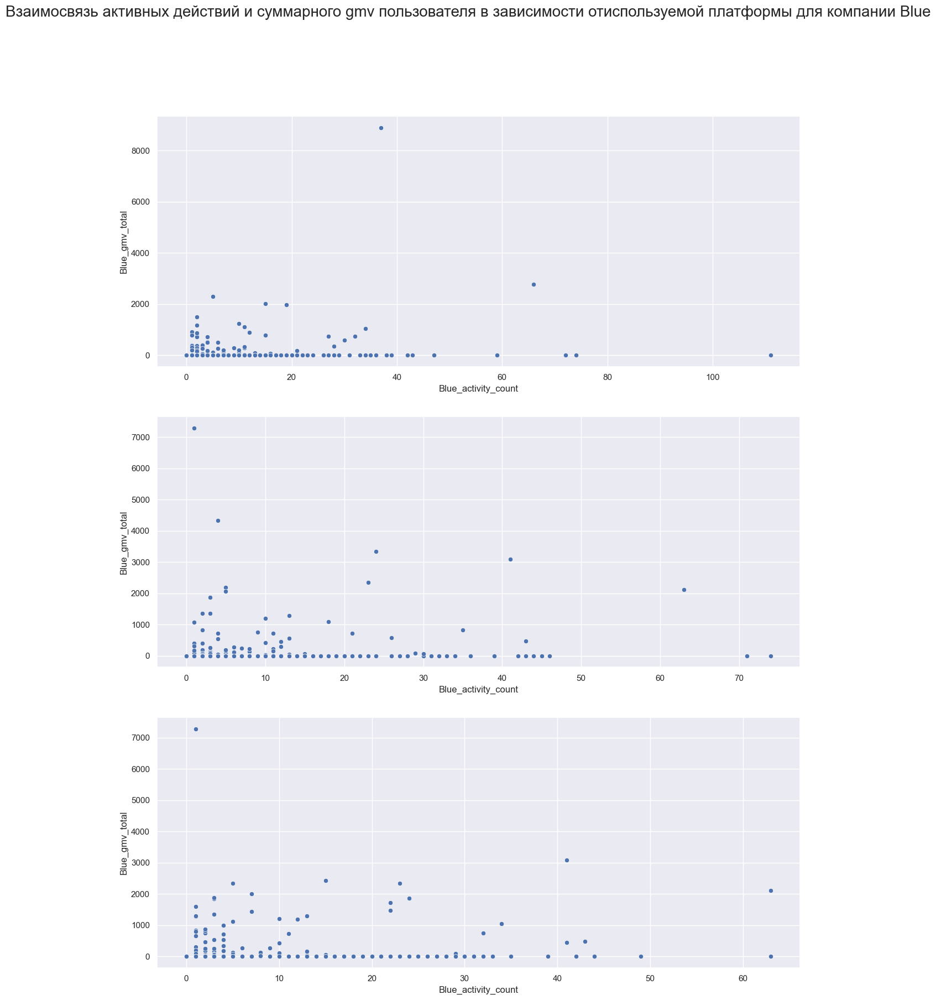

In [32]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(15,20))
sns.scatterplot(x='Blue_activity_count', y='Blue_gmv_total', data=df[df['Blue_apple'] == 1], palette='Dark2', ax=ax[0])
sns.scatterplot(x='Blue_activity_count', y='Blue_gmv_total', data=df[df['Blue_android'] == 1], palette='Dark2', ax=ax[1])
sns.scatterplot(x='Blue_activity_count', y='Blue_gmv_total', data=df[df['Blue_web'] == 1], palette='Dark2', ax=ax[2])
plt.suptitle('Взаимосвязь активных действий и суммарного gmv пользователя в зависимости от'
         'используемой платформы для компании Blue', size = 20)
plt.show()

Согласно представленным данным, для всех платформ наблюдается наблюдается тенденция, чем больше успешных заказов, тем больше суммарный gmv. Наибольшая плотность наблюдается в диапазоне 1 - 10 успешных заказов. Видно, что для платформы apple присутствуют пользователи с наибольшим количеством успешных заказов.

### 3. Изучим "суммарный gmv" (<span style="color:green">company_gmv_totalt</span>) и "количество успешных заказов пользователей" (<span style="color:green">company_gmv_order_count</span>) для каждой компании

Данные признаки представлены только для компаний *Green*, *Blue* и *Black*, при этом для компании Blue нет количества успешных заказов.

In [33]:
blue_gmv = df['Blue_gmv_total'].nunique()
green_gmv = df['Green_gmv_total'].nunique()
black_gmv = df['Black_gmv_total'].nunique()

print(f' Количество уникальных значений составляет: '
      f'Black - {black_gmv}, Blue - {blue_gmv}, Green - {green_gmv}')


 Количество уникальных значений составляет: Black - 901, Blue - 221, Green - 672


In [34]:
green_gmv_count = df['Green_gmv_order_count'].nunique()
black_gmv_count = df['Black_gmv_order_count'].nunique()

print(f' Количество уникальных значений составляет: '
      f'Black - {black_gmv_count}, Green - {green_gmv_count}')

 Количество уникальных значений составляет: Black - 37, Green - 69


Обращаем внимание, что данные в gmv_order_count имеют целочисленные значения, но представлены форматом object. Поменяем его на float64 для возможности визуализировать их

In [35]:
df['Green_gmv_order_count'] = df['Green_gmv_order_count'].astype('float64')
df['Black_gmv_order_count'] = df['Black_gmv_order_count'].astype('float64')

In [36]:
df[['Blue_gmv_total', 'Green_gmv_total', 'Black_gmv_total',
   'Green_gmv_order_count', 'Black_gmv_order_count']].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Blue_gmv_total,61118.0,3.201512,92.260075,0.0,0.0,0.0,0.0,9612.0
Green_gmv_total,61118.0,97.122386,1570.230359,0.0,0.0,0.0,0.0,94106.0
Black_gmv_total,61118.0,153.014137,2162.427416,0.0,0.0,0.0,0.0,188252.0
Green_gmv_order_count,61118.0,0.125217,2.163229,0.0,0.0,0.0,0.0,168.0
Black_gmv_order_count,61118.0,0.070585,0.949685,0.0,0.0,0.0,0.0,60.0


Сравнивая среднее и максимальное значение gmv_total каждой фирмы, видим, что у нас вероятно присутсвуют выбросы, которые можно удалить.

Данные по количеству успешных заказов распределены нормально.

Выясним, какие строки соответствуют выбросам

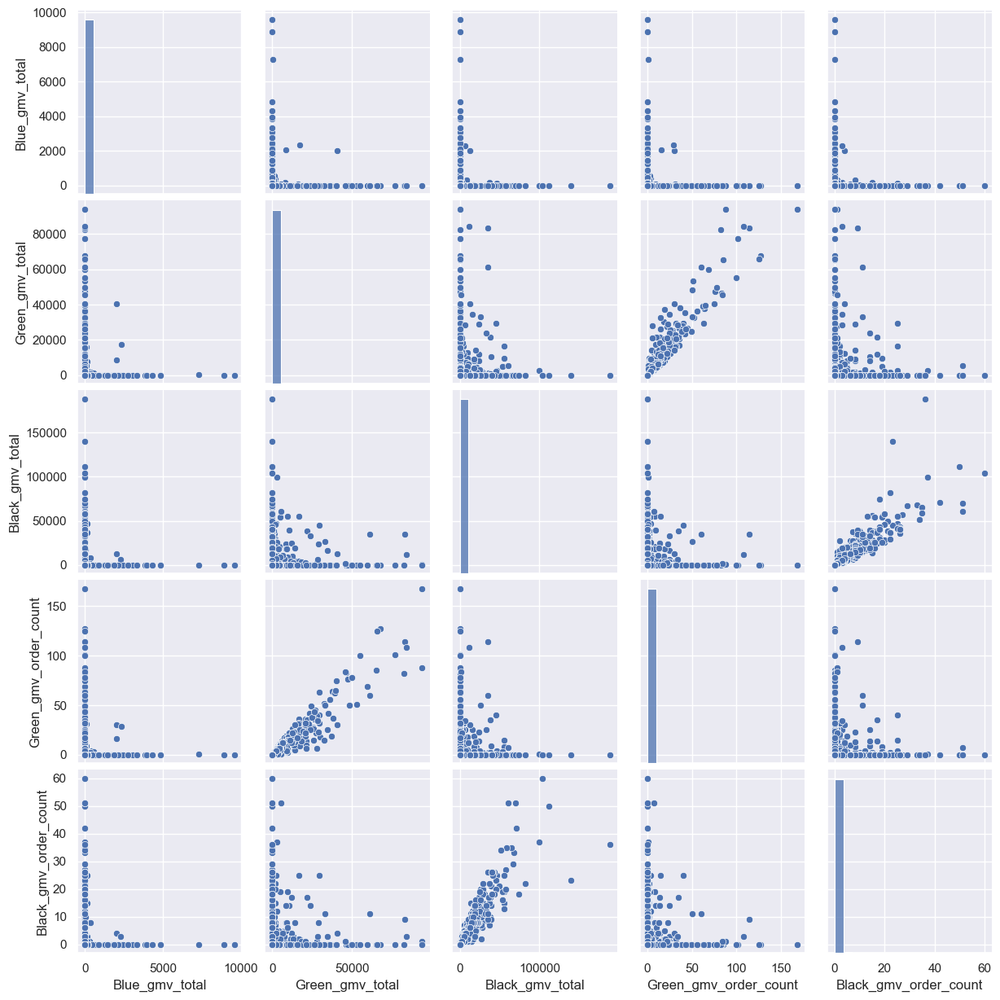

In [37]:
sns.pairplot(df[['Blue_gmv_total', 'Green_gmv_total', 'Black_gmv_total',
                'Green_gmv_order_count', 'Black_gmv_order_count']]);

In [38]:
#Согласно вышепредставленным распределениям, выставим следующие фильтры
df[(df['Blue_gmv_total'] > 5000) |
   (df['Green_gmv_total'] > 75000) |
  (df['Black_gmv_total'] > 80000)][['Blue_gmv_total', 'Green_gmv_total', 
                                     'Green_gmv_order_count', 'Black_gmv_total',
                                    'Black_gmv_order_count']]

,Blue_gmv_total,Green_gmv_total,Green_gmv_order_count,Black_gmv_total,Black_gmv_order_count
10251,0.0,0.0,0.0,111754.0,50.0
13874,0.0,0.0,0.0,82218.0,22.0
14169,9612.0,0.0,0.0,0.0,0.0
14823,0.0,77162.0,101.0,0.0,0.0
27320,0.0,82470.0,82.0,0.0,0.0
34583,0.0,2648.0,1.0,99388.0,37.0
52541,0.0,94106.0,88.0,768.0,1.0
68729,0.0,83338.0,114.0,34736.0,9.0
70220,0.0,0.0,0.0,139544.0,23.0
72700,0.0,0.0,0.0,103928.0,60.0


In [39]:
df = df.drop(labels = [10251, 13874, 14169, 14823, 27320, 34583, 52541, 68729, 70220, 72700, 76719, 78315, 78734, 93346, 94261],axis = 0)

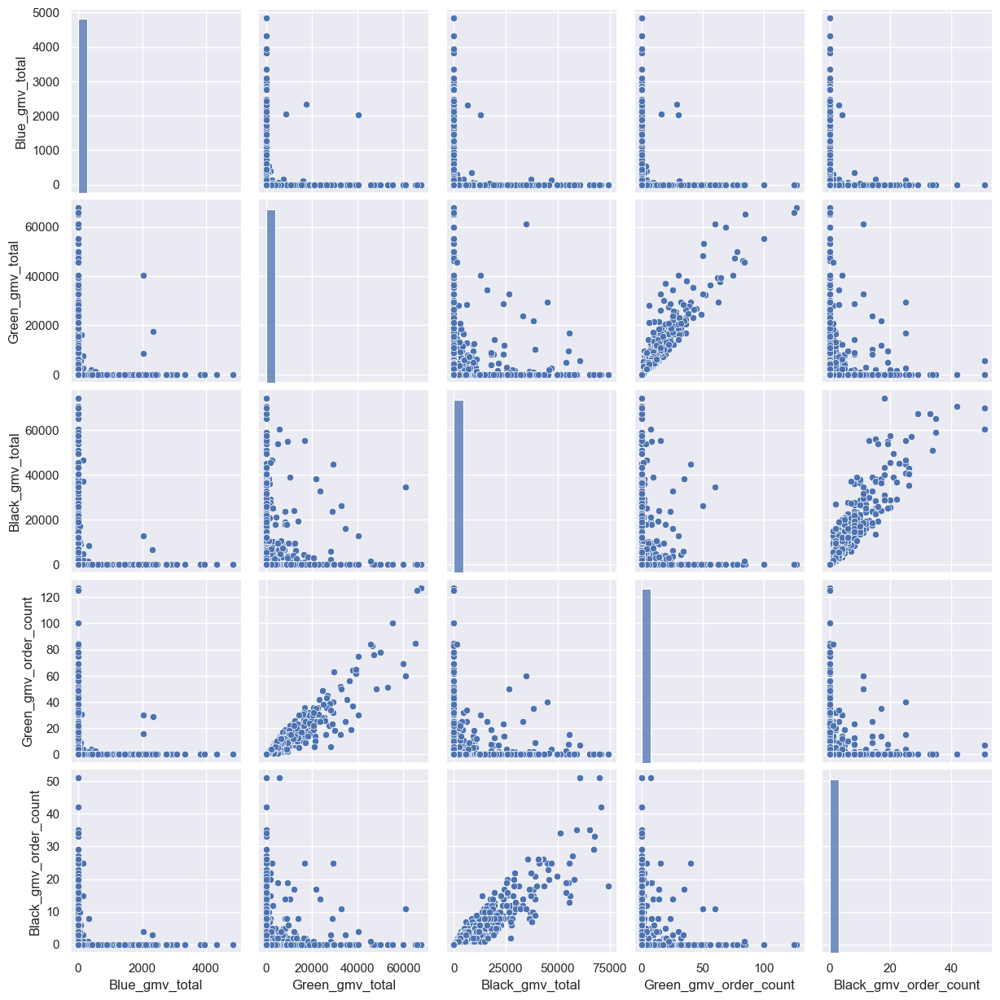

In [40]:
sns.pairplot(df[['Blue_gmv_total', 'Green_gmv_total', 'Black_gmv_total',
                'Green_gmv_order_count', 'Black_gmv_order_count']]);

Для компаний Green и Black видно прямопропорциональную зависимость суммарного gmv с ростом числа успешных заказов.

### 4. Изучим установленные у пользователей приложения в компании на платформах Android, Apple и на ПК (<span style="color:green">company_android, company_apple, company_web</span>) 

Данные представлены для всех 4-х фирм

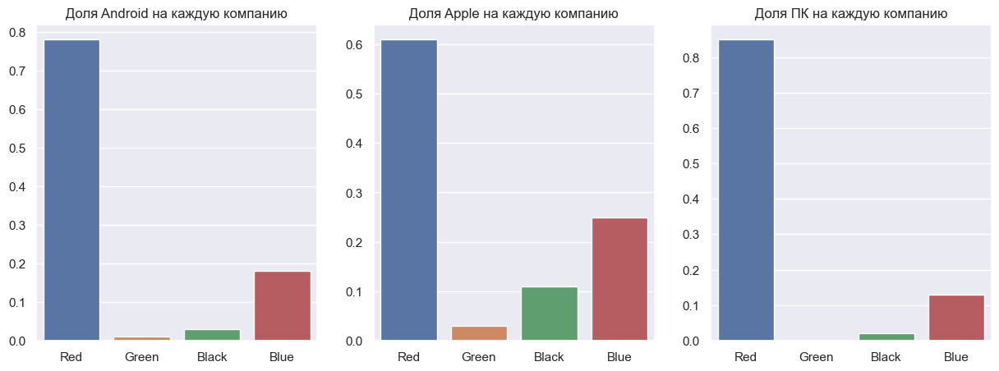

In [41]:
#Сделаем расчет необходимый переменных для вычисления доли платформ
android = df.filter(like='_android').sum().sum()
apple = df.filter(like='_apple').sum().sum()
web = df.filter(like='_web').sum().sum()

r_and = round(df['Red_android'].sum() / android, 2)
r_app = round(df['Red_apple'].sum() / apple, 2)
r_web = round(df['Red_web'].sum() / web, 2)

g_and = round(df['Green_android'].sum() / android, 2)
g_app = round(df['Green_apple'].sum() / apple, 2)
g_web = round(df['Green_web'].sum() / web, 2)

black_and = round(df['Black_android'].sum() / android, 2)
black_app = round(df['Black_apple'].sum() / apple, 2)
black_web = round(df['Black_web'].sum() / web, 2)

blue_and = round(df['Blue_android'].sum() / android, 2)
blue_app = round(df['Blue_apple'].sum() / apple, 2)
blue_web = round(df['Blue_web'].sum() / web, 2)

#Создаем данные для построения countplot
name = ['Red', 'Green', 'Black', 'Blue']
amount_and = [r_and, g_and, black_and, blue_and]
amount_app = [r_app, g_app, black_app, blue_app]
amount_web = [r_web, g_web, black_web, blue_web]

#Строим график
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
sns.barplot(x = name, y = amount_and, ax=ax[0]).set_title('Доля Android на каждую компанию')
sns.barplot(x = name, y = amount_app, ax=ax[1]).set_title('Доля Apple на каждую компанию')
sns.barplot(x = name, y = amount_web, ax=ax[2]).set_title('Доля ПК на каждую компанию');

Согласно представленному распределению, пользователи компании Green *реже* всего устанавливают приложения на всех видах платформ. Напротив, *наиболее активные* пользователи наблюдаются у компании Red, при этом больше всего установлено приложений на ПК. Для компаний Black наблюдается отставание по количеству используемых платформ более, чем в 2 раза, по сравнению с компанией Blue.

### 5. Изучим "территориальное расположение в Москве" (<span style="color:green">is_msk</span>) 



In [42]:
df['is_msk'].value_counts()

0.0    53350
1.0     7753
Name: is_msk, dtype: int64

Данные представлены в категориальном виде. Видно, что пользователей из Москвы почти в 7 раз меньше, чем из других городов.

<Figure size 1000x1000 with 0 Axes>

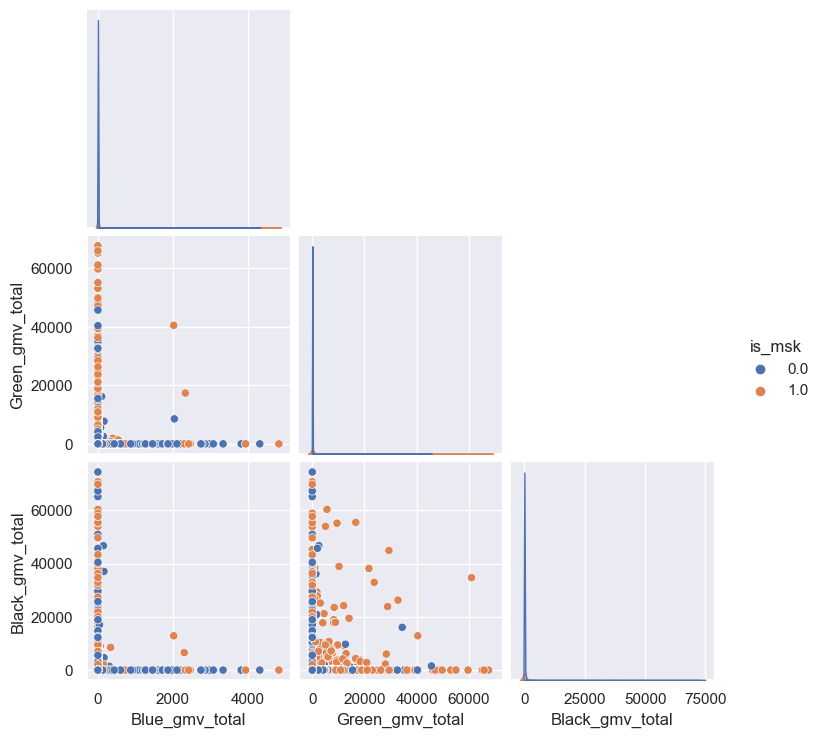

In [43]:
plt.figure(figsize=(10, 10))
sns.pairplot(df[['Blue_gmv_total', 'Green_gmv_total', 'Black_gmv_total', 'is_msk']], 
             hue = 'is_msk', corner = True);

Видим, что пользователи из Моксвы имеют больший суммарный gmv для всех компаний

In [44]:
Black_gmv_msk = df[df['is_msk'] == 1]['Black_gmv_order_count'].count()
Black_gmv_not_msk = df[df['is_msk'] == 0]['Black_gmv_order_count'].count()

Green_gmv_msk = df[df['is_msk'] == 1]['Green_gmv_order_count'].count()
Green_gmv_not_msk = df[df['is_msk'] == 0]['Green_gmv_order_count'].count()

print(f'Количество успешных заказов из Москвы меньше,'
      f'чем заказов из других городов в {(Black_gmv_not_msk + Green_gmv_not_msk) / (Black_gmv_msk + Green_gmv_msk):0.1f} раза')

Количество успешных заказов из Москвы меньше,чем заказов из других городов в 6.9 раза


## **<span style="color:red"> Выводы </span>**

1.	Информация о фирмах Red, Black, Green и Blue неполная. Для более глубокого анализа необходимо получить данные о количестве успешных заказов фирм Red, Black и Green, а также суммарный gvm и количество успешных заказов для компаний Red и Blue;
2.	Датафрейм имеет почти 40% ненужных данных в виде неактивных пользователей без регистрации в компаниях;
3.	Компания Red имеет наибольшее количество зарегистрированных пользователей, за ней следуют Blue, Black и Green;
4.	Более 8 тысяч пользователей (~8%) зарегистрированы в нескольких компаниях;
5.	Большинство пользователей компании Blue живут в Москве, совершают не более 3 действий, приводящих к увеличению gmv, и чаще всего совершают заказы с ПК;
6.	Пользователи компании Green реже устанавливают приложения на всех платформах, а компания Red имеет наибольшую популярность приложений на ПК. Компании Black и Blue имеют одинаковую популярность на всех платформах, но пользователи Blue используют приложения в два раза чаще;
7.	Среди зарегистрированных пользователей жителей Москвы меньше, чем жителей других городов, и согласно данным по компаниям Green и Black, москвичи совершают успешные заказы почти в 7 раз меньше.
